# Tutorial 3: K-Means and Time Domain Reduction

A good tool to reduce computation time of GenX is to use <a href="https://genxproject.github.io/GenX/dev/methods/#Time-Domain-Reduction-(TDR)" target="_blank">Time Domain Reduction (TDR)</a>. Time Domain Reduction is a method that selects a smaller set of time steps from the data in a way that reduces computation time while still capturing the main information of the model. In this tutorial, we go over how TDR works in GenX and how it uses K-means clustering to choose the optimal time steps. For more information on TDR in capacity expansion models, see <a href="https://www.sciencedirect.com/science/article/pii/S0360544218315238" target="_blank">Mallapragada et al</a>.

### Table of Contents
* [Time Domain Reduction](#TDR)
* [K-Means Clustering](#Kmeans)
* [Results of Time Domain Reduction](#TDRResults)
    * [Reconstruction](#Reconstruction)
* [Extreme Periods](#ExtPeriods)
* [Objective Values and Representative Periods](#ObjVals)

### Time Domain Reduction <a id="TDR"></a>

To see how Time Domain Reduction works, let's look at the `Doad_data` in `example_systems/1_three_zones`:

In [1]:
# First, load all packages needed
using DataFrames
using CSV
using VegaLite
using YAML
using PlotlyJS
using Plots
using Clustering
using ScikitLearn
@sk_import datasets: (make_blobs)

[ Info: Precompiling PlotlyJS [f0f68f2c-4968-5e81-91da-67840de0976a]


WebIO._IJuliaInit()

[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
┌ Warning: backend `GR` is not installed.
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/backends.jl:43
[ Info: Precompiling FileIOExt [f5f51d8f-5827-5d2e-939b-192fcd6ec70c]
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a]
[ Info: Precompiling ConstructionBaseStaticArraysExt [8497ba20-d017-5d93-8a79-2639523b7219]
[ Info: Precompiling ScikitLearn [3646fa90-6ef7-5e7e-9f22-8aca16db6324]
[ Info: mkl not found, proceeding to installing non-mkl versions of sci-kit learn via Conda
[ Info: Running `conda install -y -c conda-forge 'scikit-learn>=1.2,<1.3'` in root environment


Retrieving notices: ...working... done
Solving environment: ...working... done

# All requested packages already installed.





==> WARNING: A newer version of conda exists. <==
  current version: 23.3.1
  latest version: 24.1.2

Please update conda by running

    $ conda update -n base -c conda-forge conda

Or to minimize the number of packages updated during conda update use

     conda install conda=24.1.2




PyObject <function make_blobs at 0x299a5d6c0>

In [2]:
case = joinpath("example_systems/1_three_zones");

In [3]:
loads =  CSV.read(joinpath(case,"system/Demand_data.csv"),DataFrame,missingstring="NA")

Row,Voll,Demand_Segment,Cost_of_Demand_Curtailment_per_MW,Max_Demand_Curtailment,$/MWh,Rep_Periods,Timesteps_per_Rep_Period,Sub_Weights,Time_Index,Demand_MW_z1,Demand_MW_z2,Demand_MW_z3
,String7,String3,String7,String7,String7,String3,String7,String7,Int64,Int64,Int64,Int64
1,50000,1,1,1,2000,1,8760,8760,1,7850,2242,1070
2,,2,0.9,0.04,1800,,,,2,7424,2120,1012
3,,3,0.55,0.024,1100,,,,3,7107,2029,969
4,,4,0.2,0.003,400,,,,4,6947,1984,947
5,,,,,,,,,5,6922,1977,944
6,,,,,,,,,6,7045,2012,960
7,,,,,,,,,7,7307,2087,996
8,,,,,,,,,8,7544,2154,1029
9,,,,,,,,,9,7946,2269,1083


The columns to note in this file are `Rep_Periods`, `TimeSteps_Per_Rep_Period`, `Time_Index`, and `Demand_MW_`. This file shows the number of time steps used in GenX before applying TDR, i.e. every hour in a year, totaling 8,760 hours. This means that there is only one representative period, as seen in `Rep_Periods`.

TDR performs a "reduction" into a specified number of "representative periods", paring down the input data into a smaller set. The representative periods are then used in the GenX algorithm in place of the entire input data to reduce computation time. The TDR algorithm selects the representative periods to be the set of data whose results in GenX best match the results of the entire input data. To do this, TDR using k-means clustering, described in the next section.

When TDR is used, the file `time_domain_reduction_settings.yml` is called with a variety of specified settings, shown below:

In [4]:
time_domain_reduction_settings = YAML.load(open(joinpath(case,"settings/time_domain_reduction_settings.yml")))

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => 1
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 11
  "DemandWeight"          => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

Important here to note are `MinPeriods` and `MaxPeriods`. As TDR is performed, it is required to keep the number of representative periods to be between the min and max specified in the settings. This is to ensure that computation time is actually decreased and that the k-means algorithm doesn't just form one large cluster of all points. Additionally, `TimestepsPerRepPeriod` is set to 168, the number of hours in a week (`WeightTotal` includes all 8,760 timesteps, the number of hours in a year.) By specifying the number of timesteps in each representative period to be a week, we form 52 clusters from which the algorithm will choose 8-11.

For descriptions of all settings, see <a href="https://genxproject.github.io/GenX/dev/methods/#GenX.cluster_inputs" target="_blank">GenX.cluster_inputs</a> in the documentation.

Now back to pre-TDR. Below shows the load per timestep in megawatts for the entire dataset, i.e. with only one representative period of 8760 hours. This is done for Zone 1:

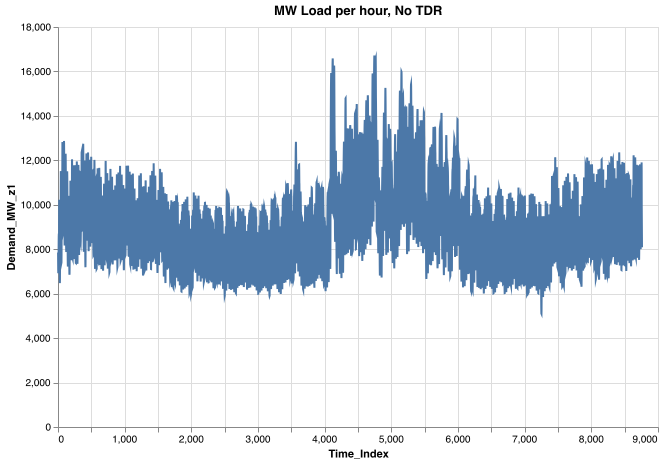

In [5]:
loads |>
@vlplot(:line, 
    x=:Time_Index, y=:Demand_MW_z1, title="MW Load per hour, No TDR",
    width=600,height=400,linewidth=.01)

As in Tutorial 1, we can open the `genx_settings.yml` file for `1_three_zones` to see how `TimeDomainReduction` is set. If it's set to 1, this means TDR is being used.

In [6]:
genx_settings_TZ = YAML.load(open((joinpath(case,"settings/genx_settings.yml"))))

Dict{Any, Any} with 13 entries:
  "NetworkExpansion"       => 1
  "ParameterScale"         => 1
  "EnergyShareRequirement" => 0
  "TimeDomainReduction"    => 1
  "Trans_Loss_Segments"    => 1
  "CapacityReserveMargin"  => 0
  "StorageLosses"          => 1
  "ComputeConflicts"       => 1
  "UCommit"                => 2
  "MaxCapReq"              => 0
  "MinCapReq"              => 1
  "CO2Cap"                 => 2
  "WriteShadowPrices"      => 1

To visualize how TDR decreases computation time, let's start by running `SmallNewEngland/OneZone` without TDR. In the third section of this tutorial, we'll run the example again using TDR.

To run GenX without TDR, we start by editing the settings to set `TimeDomainReduction` to 0:

In [7]:
genx_settings_TZ["TimeDomainReduction"] = 0
genx_settings_TZ ## Output settings

Dict{Any, Any} with 13 entries:
  "NetworkExpansion"       => 1
  "ParameterScale"         => 1
  "EnergyShareRequirement" => 0
  "TimeDomainReduction"    => 0
  "Trans_Loss_Segments"    => 1
  "CapacityReserveMargin"  => 0
  "StorageLosses"          => 1
  "ComputeConflicts"       => 1
  "UCommit"                => 2
  "MaxCapReq"              => 0
  "MinCapReq"              => 1
  "CO2Cap"                 => 2
  "WriteShadowPrices"      => 1

Then we write the edited settings to the file path:

In [8]:
YAML.write_file((joinpath(case,"settings/genx_settings.yml")), genx_settings_TZ)

And run it using `include`. (Note: this process will take a few minutes):

In [9]:
@time include("example_systems/1_three_zones/Run.jl")

[ Info: Precompiling SpecialFunctionsExt [997ecda8-951a-5f50-90ea-61382e97704b]


Configuring Settings
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.



Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Discharge Module
Non-served 

Writing Output
Time elapsed for writing costs is
1.420671375
Time elapsed for writing capacity is
0.353754208
Time elapsed for writing power is
0.791224333
Time elapsed for writing charge is
0.238020875
Time elapsed for writing capacity factor is
0.267234167
Time elapsed for writing storage is
0.1533565
Time elapsed for writing curtailment is
0.22882575
Time elapsed for writing nse is
0.689141083
Time elapsed for writing power balance is
0.564463625
Time elapsed for writing transmission flows is
0.115057167
Time elapsed for writing transmission losses is
0.13777025
Time elapsed for writing network expansion is
0.081572459
Time elapsed for writing emissions is
0.35390225
Time elapsed for writing reliability is
0.137184458
Time elapsed for writing storage duals is
0.395784625
Time elapsed for writing commitment is
0.140844708
Time elapsed for writing startup is
0.099097041
Time elapsed for writing shutdown is
0.066915041
Time elapsed for writing fuel consumption is
0.483710125
Time elaps

This took a little while to run, and would take even longer for larger systems. Let's see how we can get the run time down using Time Domain Reduction. The next sections go over how K-means clustering is used to perform TDR, and how to interpret the resulting files in GenX.

### _K_-means clustering <a id="Kmeans"></a>

Let's go over how TDR works. To perform TDR, GenX uses ___K_-means clustering__. _K_-means is an optimization method that clusters data into several groups based on their proximity to "centers" determined by the algorithm. 

_K_-means finds a set number of groups such that the variance between the distance of each point in the group to the mean of the group is minimized. 

$$
\begin{align*}
\mathop{\arg \min}\limits_{\mathbf{S}} & \sum_{i = 1}^k \sum_{x \in S_i} ||x - \mu_i||^2 \\
\end{align*}
$$

Where $\mathbf{S} = \{S_1, ... , S_k\}$ are the clusters, with $x$ denoting the elements of the clusters, and $\mu_i$ the mean of each cluster, i.e. the mean of the distances from each point to the center of the cluster. By taking the argmin over $\mathbf{S}$, the points $x$ are clustered into groups where their distance to the center is the smallest. For more information on how k-means works, see the  <a href="https://en.wikipedia.org/wiki/K-means_clustering" target="_blank">Wikipedia</a>. 

GenX uses the package `Clustering.jl`, with documentation <a href="https://juliastats.org/Clustering.jl/dev/kmeans.html#K-means" target="_blank">here</a>. As an example, using the package `ScikitLearn.jl`, let's generate data that can cluster easily.

In [10]:
centers = 5
X, y = make_blobs(n_samples=50,centers=centers); # From scikit-learn
b = DataFrame(X,:auto)

Row,x1,x2
,Float64,Float64
1,-3.9766,-0.668439
2,-4.38,-2.52002
3,10.8963,2.70473
4,10.0999,3.37697
5,-4.64019,-6.56397
6,-4.02848,-0.621931
7,-5.56354,-7.77815
8,4.72007,3.38912
9,-8.14538,3.36909


Note that clustering works for data without obvious groupings, but using blobs as an example makes _k_-means easier to visualize.

In [34]:
plotly()
Plots.scatter(b[!,"x1"],b[!,"x2"],legend=false,title="Before K-means Clustering")

Now we use the function `kmeans`, which is also used in `src/time_domain_reduction` in GenX.

In [12]:
R = kmeans(transpose(Matrix(b)),centers)

KmeansResult{Matrix{Float64}, Float64, Int64}([-5.233755085301982 9.831994566770287 … -6.8535462942588 4.701898325992417; -9.118573336429218 3.76917252619153 … 2.516853909266395 2.7478200453882593], [3, 3, 2, 2, 1, 3, 1, 5, 4, 2  …  4, 1, 1, 3, 3, 4, 3, 2, 3, 5], [1.0443151799501287, 2.1261836655536754, 2.2658037218653533, 0.2256208642670856, 6.878339593024862, 1.1890448930026025, 1.9054973556987989, 0.41159559065486917, 2.395127169867635, 0.7410084791557097  …  0.5405428638498222, 0.06183706033377234, 0.20222080790799168, 0.4010698675310138, 0.5500272812739269, 2.1163994738071352, 6.983322417090175, 0.37486888307316235, 0.3831216320774118, 0.23466306387032887], [10, 10, 10, 10, 10], [10, 10, 10, 10, 10], 87.25505990604431, 3, true)

`kmeans` returns three outputs: assignments, centers, and counts. Assignments shows to which cluster each points belongs, centers shows where the center coordinates of each cluster are, and counts shows how many points belong to each cluster.

In [13]:
println("Assignments = ",R.assignments)
println("")
println("Counts = ",R.counts)
println("")
println("Centers:")
R.centers

Assignments = [3, 3, 2, 2, 1, 3, 1, 5, 4, 2, 5, 4, 5, 3, 1, 4, 2, 4, 1, 1, 3, 4, 5, 2, 1, 5, 1, 5, 5, 1, 3, 2, 4, 2, 5, 2, 2, 5, 4, 4, 4, 1, 1, 3, 3, 4, 3, 2, 3, 5]

Counts = [10, 10, 10, 10, 10]

Centers:


2×5 Matrix{Float64}:
 -5.23376  9.83199  -3.35692  -6.85355  4.7019
 -9.11857  3.76917  -1.48103   2.51685  2.74782

In [14]:
plotly()
Plots.scatter(b[!,"x1"],b[!,"x2"],legend=false,marker_z=R.assignments,c=:lightrainbow,title="After K-means Clustering")

In GenX, the representative periods are the centers of the clusters, each representing one week of the year. In the above example that would mean there are 52 data points gathered into 11 clusters (to see this for yourself, change `make_blobs` to have 52 data points and 11 clusters.)

### Results of Time Domain Reduction <a id="TDRResults"></a>

To visualize the results of TDR, we'll set TDR = 1 back in the `genx_settings.yml` file in `example_systems/1_three_zones/`:

In [15]:
genx_settings_TZ["TimeDomainReduction"] = 1;

In [16]:
genx_settings_TZ

Dict{Any, Any} with 13 entries:
  "NetworkExpansion"       => 1
  "ParameterScale"         => 1
  "EnergyShareRequirement" => 0
  "TimeDomainReduction"    => 1
  "Trans_Loss_Segments"    => 1
  "CapacityReserveMargin"  => 0
  "StorageLosses"          => 1
  "ComputeConflicts"       => 1
  "UCommit"                => 2
  "MaxCapReq"              => 0
  "MinCapReq"              => 1
  "CO2Cap"                 => 2
  "WriteShadowPrices"      => 1

In [17]:
YAML.write_file((joinpath(case,"settings/genx_settings.yml")), genx_settings_TZ)

And run GenX again with TDR:

In [153]:
@time include("example_systems/1_three_zones/Run.jl")

Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Error: Geography Key 1 is invalid. Select `System' or `Zone'.


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Fuel Module
CO2 Module
Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
0.660270833
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 153398 rows, 120139 columns and 515480 nonzeros
Model fingerprint: 0xb4532f7a
Coefficient statistics:
  Matrix 

Time elapsed for writing transmission losses is
0.13388225
Time elapsed for writing network expansion is
0.00056825
Time elapsed for writing emissions is
0.029318625
Time elapsed for writing reliability is
0.008469167
Time elapsed for writing storage duals is
0.011226042
Time elapsed for writing commitment is
0.007482208
Time elapsed for writing startup is
0.014083542
Time elapsed for writing shutdown is
0.013680875
Time elapsed for writing fuel consumption is
0.051863542
Time elapsed for writing co2 is
0.023274125
Time elapsed for writing price is
0.007829458
Time elapsed for writing energy revenue is
0.015145458
Time elapsed for writing charging cost is
0.007159042
Time elapsed for writing subsidy is
0.000515041
Time elapsed for writing time weights is
0.000534333
Time elapsed for writing co2 cap is
0.000204459
Time elapsed for writing minimum capacity requirement is
0.000156792
Time elapsed for writing net revenue is
0.0239515
Wrote outputs to /Users/mayamutic/Desktop/GenX-Tutorials

As you can see, this took a significantly shorter amount of time to run!

Csv files with the results of TDR are generated automatically in a folder called `TDR_results` found within the same folder containing the input csv files, in this case `example_systems/1_three_zones`. The csv files in this folder show the files used in `Run.jl` that have been pared down from the initial input files.

As an example, consider the input file `Fuels_data.csv`:

In [19]:
Fuels_original = CSV.read(joinpath(case,"system/Fuels_data.csv"),DataFrame,missingstring="NA")

Row,Time_Index,CT_NG,ME_NG,MA_NG,None
,Int64,Float64,Float64,Float64,Int64
1,0,0.05306,0.05306,0.05306,0
2,1,5.45,5.45,5.28,0
3,2,5.45,5.45,5.28,0
4,3,5.45,5.45,5.28,0
5,4,5.45,5.45,5.28,0
6,5,5.45,5.45,5.28,0
7,6,5.45,5.45,5.28,0
8,7,5.45,5.45,5.28,0
9,8,5.45,5.45,5.28,0


Compared to `TDR_results/Fuels_data.csv`:

In [20]:
Fuels_TDR = CSV.read(joinpath(case,"TDR_results/Fuels_data.csv"),DataFrame,missingstring="NA")

Row,Time_Index,CT_NG,ME_NG,MA_NG,None
,Int64,Float64,Float64,Float64,Float64
1,0,0.05306,0.05306,0.05306,0.0
2,1,5.45,5.45,5.28,0.0
3,2,5.45,5.45,5.28,0.0
4,3,5.45,5.45,5.28,0.0
5,4,5.45,5.45,5.28,0.0
6,5,5.45,5.45,5.28,0.0
7,6,5.45,5.45,5.28,0.0
8,7,5.45,5.45,5.28,0.0
9,8,5.45,5.45,5.28,0.0


As you can see, the original has all 8,760 hours, while the TDR version only has 1,848 hours.

In [21]:
loads_TDR = CSV.read(joinpath(case,"TDR_results/Demand_data.csv"),DataFrame,missingstring="NA")

Row,Voll,Demand_Segment,Cost_of_Demand_Curtailment_per_MW,Max_Demand_Curtailment,$/MWh,Rep_Periods,Timesteps_per_Rep_Period,Sub_Weights,Time_Index,Demand_MW_z1,Demand_MW_z2,Demand_MW_z3
,String7,String3,String7,String7,String7,String3,String3,String31,Int64,Float64,Float64,Float64
1,50000,1,1.0,1.0,2000,11,168,673.8461538461539,1,8767.2,2504.24,1195.84
2,,2,0.9,0.04,1800,,,168.46153846153848,2,8480.0,2422.16,1156.81
3,,3,0.55,0.024,1100,,,1347.6923076923078,3,8341.9,2382.13,1136.8
4,,4,0.2,0.003,400,,,673.8461538461539,4,8280.86,2366.11,1128.79
5,,,,,,,,842.3076923076924,5,8335.9,2381.13,1136.8
6,,,,,,,,1010.7692307692308,6,8563.06,2446.18,1166.82
7,,,,,,,,1347.6923076923078,7,8965.34,2561.29,1222.86
8,,,,,,,,1010.7692307692308,8,9405.66,2686.4,1282.9
9,,,,,,,,168.46153846153848,9,9989.07,2852.55,1361.96


The 1,848 hours are divided into 11 sections of 168 hours, with each section representing one week of the original data.  The number of hours per representative period is set in `time_domain_reduction_settings.yml`. Also specified in the file are the minimum and maximum number of clusters we would like to have (in this case 8 and 11). The k-means algorithm will then select the number of clusters that should be sufficient to capture the GenX model in fewer time steps (in this case 11).

Below, we create arrays out of the representative weeks and plot them on the same plot used in the beginning of this tutorial. The file `Period_map` shows which periods (weeks) are used in TDR and which time step corresponds to each period:

In [24]:
Period_map = CSV.read(joinpath(case,"TDR_Results/Period_map.csv"),DataFrame,missingstring="NA")

Row,Period_Index,Rep_Period,Rep_Period_Index
,Int64,Int64,Int64
1,1,4,1
2,2,4,1
3,3,4,1
4,4,4,1
5,5,5,2
6,6,6,3
7,7,6,3
8,8,6,3
9,9,6,3


In [25]:
# Find array of unique representative periods
rep_periods = unique(Period_map[!,"Rep_Period"])

# Create an array of the time steps and MW values of each representative period
weeks_load = []
weeks_wind = []
for i in rep_periods
    week_temp_loads = [repeat([i],168) loads[(168*i-167):168*i,"Time_Index"] loads[(168*i-167):168*i,"Demand_MW_z1"]]
    week_temp_wind = [repeat([i],168) generators[(168*i-167):168*i,"Time_Index"] generators[(168*i-167):168*i,"CT_onshore_wind"]]
    weeks_load = [weeks_load; week_temp_loads]
    weeks_wind = [weeks_wind; week_temp_wind]
end

In [26]:
# Combine with Total (pre TDR)
loads_plot = [repeat(["Total"],8760) loads[!,"Time_Index"] loads[!,"Demand_MW_z1"]];

8760×3 Matrix{Any}:
 "Total"     1  0.569945
 "Total"     2  0.623259
 "Total"     3  0.694188
 "Total"     4  0.6474
 "Total"     5  0.381774
 "Total"     6  0.244583
 "Total"     7  0.293397
 "Total"     8  0.378603
 "Total"     9  0.329338
 "Total"    10  1.52e-5
 "Total"    11  4.55e-5
 "Total"    12  0.00057204
 "Total"    13  0.0868018
 ⋮              
 "Total"  8749  0.904116
 "Total"  8750  0.719637
 "Total"  8751  0.299922
 "Total"  8752  0.255119
 "Total"  8753  0.505676
 "Total"  8754  0.899923
 "Total"  8755  0.988318
 "Total"  8756  0.30553
 "Total"  8757  0.445488
 "Total"  8758  0.304045
 "Total"  8759  0.617811
 "Total"  8760  0.652052

In [27]:
# Add column names and convert column type
loads_with_TDR = [loads_plot; weeks_load]
loads_with_TDR = DataFrame(loads_with_TDR ,["Week","hour", "MW"])
loads_with_TDR[!,:hour] = convert.(Int64,loads_with_TDR[!,:hour]);
loads_with_TDR[!,:MW] = convert.(Float64,loads_with_TDR[!,:MW]);

Here's the same plot from before but with representative weeks highlighted:

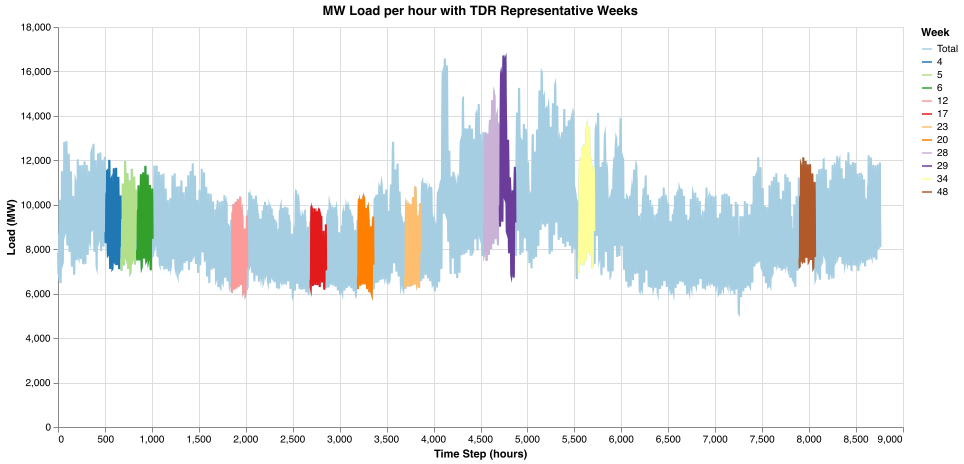

In [29]:
loads_with_TDR  |>
@vlplot(mark={:line},
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="decsending"}, title="MW Load per hour with TDR Representative Weeks",
    width=845,height=400)

TDR is performed for four total data sets: demand (found in `Demand.csv`), wind and solar (found in `Generators_variability.csv`), and fuel prices (found in `Fuels.csv`). Above is just the demand load for one of the three total nodes in the example system, which is why the data may not appear to "represent" all 52 weeks (notice there are fewer representative periods in the fall). Instead, the periods more accurately represent all the data time series combined, including some other parts of the data not seen in this particular plot.

### Extreme Periods Off <a id="ExtPeriods"></a>

GenX has a feature called `ExtremePeriods`, which forces _k_-means to include the highest and lowest points in the algorithm. This is done to ensure outliers are used, which is needed in planning energy capacity as the system needs to be able to account for outliers in energy needs. In the load demand plot above, we can see that energy needs peak during the summer, and that the week with the highest load demand is included as a representative week. Let's try turning extreme periods off, and see what happens.

In [38]:
time_domain_reduction_settings["ExtremePeriods"] = 0;
YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings);
rm(joinpath(case,"TDR_results"), recursive=true) 

In [39]:
include("example_systems/1_three_zones/Run.jl")

Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.



Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Gene

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
0.641633125
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 153398 rows, 120139 columns and 515540 nonzeros
Model finger

Time elapsed for writing shutdown is
0.015398875
Time elapsed for writing fuel consumption is
0.062946625
Time elapsed for writing co2 is
0.024176917
Time elapsed for writing price is
0.007367542
Time elapsed for writing energy revenue is
0.018024208
Time elapsed for writing charging cost is
0.007289584
Time elapsed for writing subsidy is
0.000451583
Time elapsed for writing time weights is
0.000505083
Time elapsed for writing co2 cap is
0.0002065
Time elapsed for writing minimum capacity requirement is
0.000371959
Time elapsed for writing net revenue is
0.028597333
Wrote outputs to /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones/results_4
Time elapsed for writing is
0.731846208


In [47]:
Loads_TDR2 = CSV.read(joinpath(case,"TDR_results/Demand_data.csv"),DataFrame,missingstring="NA");
Period_map2 = CSV.read(joinpath(case,"TDR_results/Period_map.csv"),DataFrame,missingstring="NA")

Row,Period_Index,Rep_Period,Rep_Period_Index
,Int64,Int64,Int64
1,1,4,1
2,2,4,1
3,3,4,1
4,4,4,1
5,5,8,2
6,6,8,2
7,7,8,2
8,8,8,2
9,9,8,2


In [90]:
rep_periods2 = unique(Period_map2[!,"Rep_Period"])

weeks2 = []
for i in rep_periods2
    week_temp = [repeat([i],168) loads[(168*i-167):168*i,"Time_Index"] loads[(168*i-167):168*i,"Demand_MW_z1"]]
    weeks2 = [weeks2; week_temp]
end

weeks2 = [weeks2 repeat(["Off"],1848)];

In [91]:
loads_plotOff = [repeat(["Total"],8760) loads[!,"Time_Index"] loads[!,"Demand_MW_z1"] repeat(["Off"],8760) ];
loads_with_TDR[!,"Extreme_Periods"] = repeat(["On"],length(loads_with_TDR[!,1]));
loads_with_TDR2 = [loads_plotOff; weeks2]

10608×4 Matrix{Any}:
   "Total"     1   7850  "Off"
   "Total"     2   7424  "Off"
   "Total"     3   7107  "Off"
   "Total"     4   6947  "Off"
   "Total"     5   6922  "Off"
   "Total"     6   7045  "Off"
   "Total"     7   7307  "Off"
   "Total"     8   7544  "Off"
   "Total"     9   7946  "Off"
   "Total"    10   8340  "Off"
   "Total"    11   8578  "Off"
   "Total"    12   8666  "Off"
   "Total"    13   8707  "Off"
  ⋮                      
 49         8221   9258  "Off"
 49         8222   9208  "Off"
 49         8223   9157  "Off"
 49         8224   9403  "Off"
 49         8225  10502  "Off"
 49         8226  11126  "Off"
 49         8227  11064  "Off"
 49         8228  10807  "Off"
 49         8229  10387  "Off"
 49         8230   9693  "Off"
 49         8231   8769  "Off"
 49         8232   7894  "Off"

In [92]:
loads_with_TDR2 = DataFrame(loads_with_TDR2 ,["Week","hour","MW","Extreme_Periods"])
loads_with_TDR2[!,:hour] = convert.(Int64,loads_with_TDR2[!,:hour]);
loads_with_TDR2[!,:MW] = convert.(Float64,loads_with_TDR2[!,:MW]);

In [185]:
myscheme = ["#a6cee3","#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c","#fdbf6f","#ff7f00",
    "#cab2d6","#6a3d9a","#ffff99","#b15928","#b1ff00","#095768","#ce7e00","#b4a7d6"];

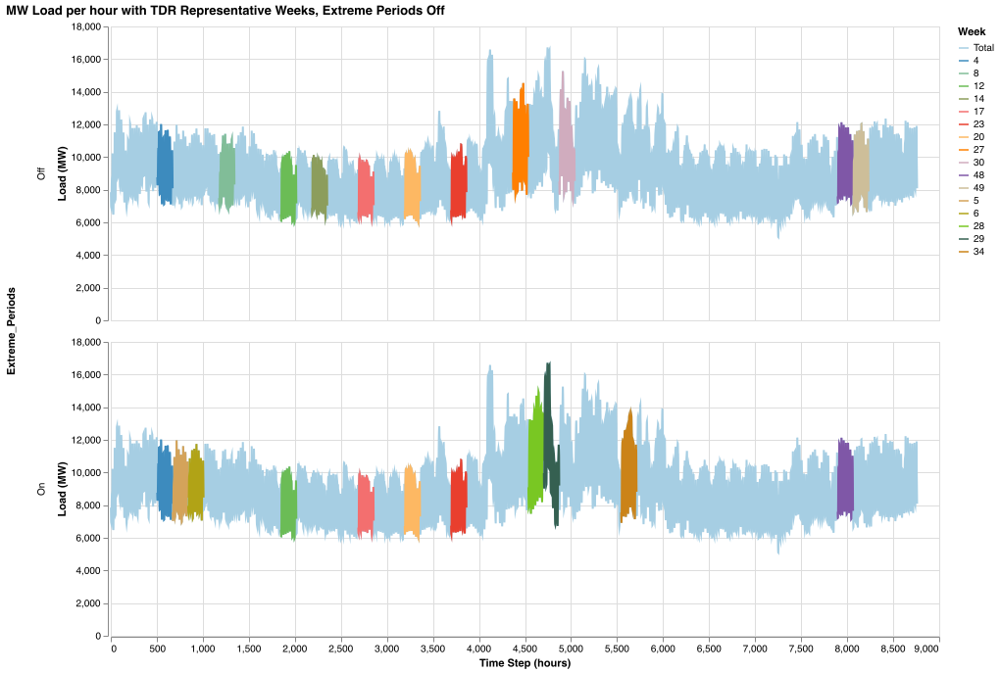

In [184]:
[loads_with_TDR2; loads_with_TDR] |>
@vlplot(mark={:line}, row="Extreme_Periods:n",
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme=myscheme},sort="decsending"}, 
    title="MW Load per hour with TDR Representative Weeks, Extreme Periods Off",
    width=845,height=300)

As you can see, the first plot (with Extreme Periods off) does not have the week with the highest peak highlighted.

Turn Extreme Periods back on:

In [116]:
time_domain_reduction_settings["ExtremePeriods"] = 1;
YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings);
rm(joinpath(case,"TDR_results"), recursive=true) 

#### Reconstruction <a id="Reconstruction"></a>

Below is a plot of a reconstruction of the data using only the weeks isolated as representative periods. This is what GenX reads when it runs the solver with TDR on.



In [121]:
recon = []
for i in range(1,52)
    index = Period_map[i,"Rep_Period"]
    recon_temp = [repeat([index],168) collect((168*i-167):168*i) loads[(168*index-167):168*index,"Demand_MW_z1"]]
    recon = [recon; recon_temp]
end


In [122]:
recon = DataFrame(recon,["Week","hour", "MW"])
recon[!,:hour] = convert.(Int64,recon[!,:hour]);
recon[!,:MW] = convert.(Float64,recon[!,:MW]);
recon[!,"Extreme_Periods"] = repeat(["On"],length(recon[!,1]));

In [123]:
recon_noex = []
for i in range(1,52)
    index = Period_map2[i,"Rep_Period"]
    recon_noex_temp = [repeat([index],168) collect((168*i-167):168*i) loads[(168*index-167):168*index,"Demand_MW_z1"]]
    recon_noex = [recon_noex; recon_noex_temp]
end

recon_noex = [recon_noex repeat(["Off"],8736)];

recon_noex = DataFrame(recon_noex,["Week","hour", "MW", "Extreme_Periods"])
recon_noex[!,:hour] = convert.(Int64,recon_noex[!,:hour]);
recon_noex[!,:MW] = convert.(Float64,recon_noex[!,:MW]);

In [166]:
recon_noex

Row,Week,hour,MW,Extreme_Periods
,Any,Int64,Float64,Any
1,4,1,8761.0,Off
2,4,2,8474.0,Off
3,4,3,8336.0,Off
4,4,4,8275.0,Off
5,4,5,8330.0,Off
6,4,6,8557.0,Off
7,4,7,8959.0,Off
8,4,8,9399.0,Off
9,4,9,9982.0,Off


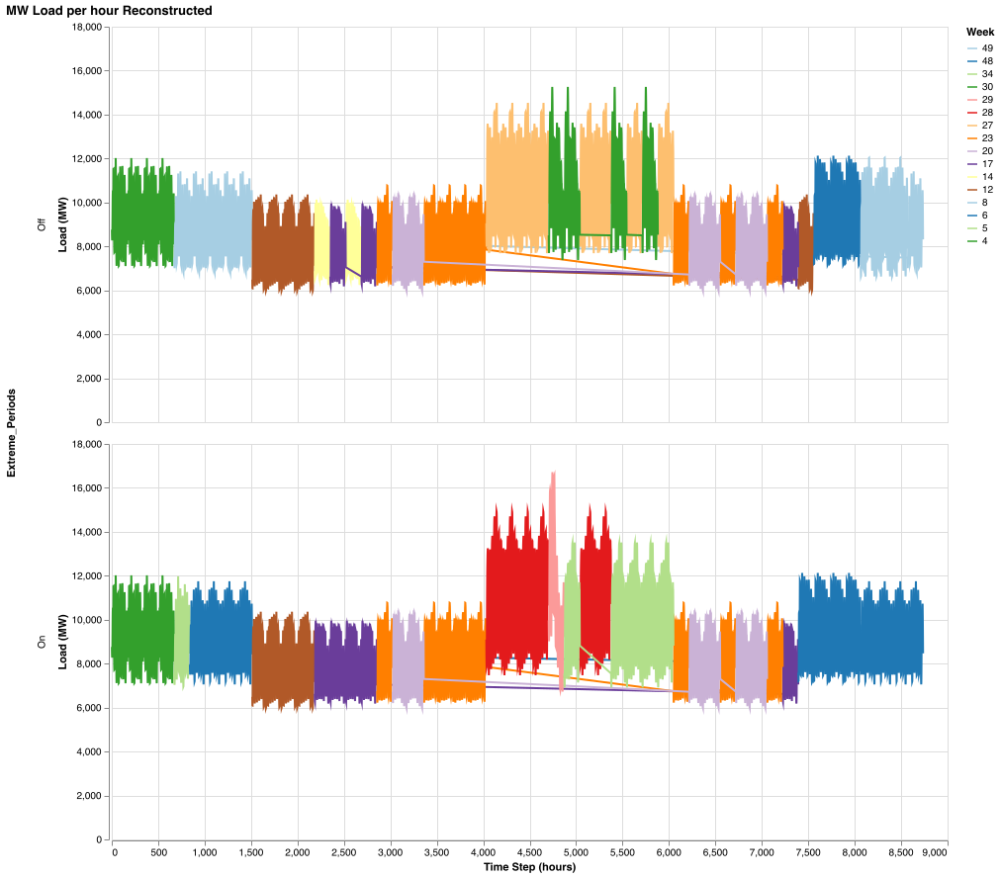

In [186]:
[recon_noex; recon]  |>
@vlplot(mark={:line}, row="Extreme_Periods:n",
    x={:hour,title="Time Step (hours)",labels="Week:n"}, y={:MW,title="Load (MW)"},
    color={"Week:n", scale={scheme="paired"},sort="descending"},title="MW Load per hour Reconstructed",
    width=845,height=400)

In [175]:
recon_noex[recon_noex.hour.>3020 .&& recon_noex.hour.<3050, :]

Row,Week,hour,MW,Extreme_Periods
,Any,Int64,Float64,Any
1,23,3021,9938.0,Off
2,23,3022,9712.0,Off
3,23,3023,8783.0,Off
4,23,3024,7852.0,Off
5,20,3025,6722.0,Off
6,20,3026,6422.0,Off
7,20,3027,6253.0,Off
8,20,3028,6207.0,Off
9,20,3029,6397.0,Off


The range of 8-11 representative periods was chosen by the developers because it was deemed to be the smallest set that still matches the optimal value of the data well. The next section of this Tutorial goes over how the optimal values of the data change as the number of representative periods changes.

### Objective Values and Representative Periods <a id="ObjVals"></a>

Each time `Run.jl` is run, a `results` folder is produced. This folder contains numerous .csv files with output variable from the GenX model. For more information on all outputs, see the documentation <a href="https://genxproject.github.io/GenX/dev/data_documentation/#Outputs" target="_blank">here</a>.

This section focuses on the __objective value__ of the model. In optimization problems, the objective value is the main value minimized or maximized within the constraints of the model, according to the __objective function__ specified in the problem formulation. In the case of GenX, the objective function is the total annual electricity system cost. A detailed description of the optimization problem is  <a href="https://genxproject.github.io/GenX/dev/objective_function/" target="_blank">here</a> in the documentation. 

For the purpose of this tutorial, we focus on the objective value as a way to evaluate how well the representative periods actually "represent" the entire model. To see how well the objective value of representative periods aligns with that of the total period, we can run `example_systems/1_three_zone` with a variety of minimum and maximum total periods.

As a reminder, here are the time domain reduction settings we've been using:

In [125]:
time_domain_reduction_settings

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => 1
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 11
  "DemandWeight"          => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

Each time Run.jl is run, a new results folder appears in the model folder. These folders are __not__ overwritten. So far, we've run the model three times, so we should have three results folders in the `1_three_zones` folder, but you may have more if you've run the model more than twice. To ensure that the following code works, we'll delete any results folders beyond the original.

In [138]:
folders = cd(readdir,case)
     

21-element Vector{String}:
 ".DS_Store"
 "README.md"
 "Run.jl"
 "TDR_results"
 "policies"
 "resources"
 "results"
 "results_1"
 "results_10"
 "results_11"
 "results_12"
 "results_2"
 "results_3"
 "results_4"
 "results_5"
 "results_6"
 "results_7"
 "results_8"
 "results_9"
 "settings"
 "system"

In [139]:
for folder in folders
    if length(folder) >= 8 && folder[1:8] == "results_"
        rm("example_systems/1_three_zones/" * folder,recursive=true) 
    end
end
     
cd(readdir,case) ## Make sure they were deleted

9-element Vector{String}:
 ".DS_Store"
 "README.md"
 "Run.jl"
 "TDR_results"
 "policies"
 "resources"
 "results"
 "settings"
 "system"

To demonstrate how the objective value changes as the number of representative periods does, we'll run GenX ten times, each with a different number of periods, and plot the objective values.

In [140]:
# Change MinPeriods and Max Periods, run `Run.jl`
# For simplicity, keep min and max periods the same
rep_periods = [4, 8, 12, 24, 36, 48]
times = [0.0,0.0,0.0,0.0,0.0,0.0]

for i in range(1,6)
    println(" ")
    println("----------------------------------------------------")
    println("Iteration ",i)
    println("Periods = ",rep_periods[i])
    println("----------------------------------------------------")
    time_domain_reduction_settings["MinPeriods"] = rep_periods[i]
    time_domain_reduction_settings["MaxPeriods"] = rep_periods[i]
    if "TDR_results" in cd(readdir,case)
        rm(joinpath(case,"TDR_results"), recursive=true) 
    end
    println(" ")
    YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings)
    time = @elapsed include("example_systems/1_three_zones/Run.jl")
    times[i] = time
    println(" ")
    println("Total Elapsed Time: ", time, " seconds")
end

    

 
----------------------------------------------------
Iteration 1
Periods = 4
----------------------------------------------------
 
Configuring Settings
Clustering Time Series Data (Grouped)...
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.



Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Error: Geography Key 1 is invalid. Select `System' or `Zone'.


[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
0.325680333
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 55790 rows, 43699 columns and 187468 nonzeros
Model fingerprint: 0xcc2849e4
Coefficient statistics:
  Matrix range     [3e-06, 1e+01]


[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


CO2 Module
Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
0.463519125
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 111566 rows, 87379 columns and 374927 nonzeros
Model fingerprint: 0x2cc6761a
Coefficient statistics:
  Matrix range     [4e

Time elapsed for writing reliability is
0.129265041
Time elapsed for writing storage duals is
0.015809125
Time elapsed for writing commitment is
0.008620292
Time elapsed for writing startup is
0.012947292
Time elapsed for writing shutdown is
0.013737458
Time elapsed for writing fuel consumption is
0.050473667
Time elapsed for writing co2 is
0.018297959
Time elapsed for writing price is
0.007848208
Time elapsed for writing energy revenue is
0.013285417
Time elapsed for writing charging cost is
0.006743542
Time elapsed for writing subsidy is
0.000378958
Time elapsed for writing time weights is
0.000402916
Time elapsed for writing co2 cap is
0.000157834
Time elapsed for writing minimum capacity requirement is
9.7875e-5
Time elapsed for writing net revenue is
0.01915675
Wrote outputs to /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones/results_2
Time elapsed for writing is
0.593301791
 
Total Elapsed Time: 4.432477459 seconds
 
--------------------------------

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
0.726843375
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 167342 rows, 131059 columns and 562268 nonzeros
Model finger

Time elapsed for writing costs is
0.136357916
Time elapsed for writing capacity is
0.000671833
Time elapsed for writing power is
0.030177875
Time elapsed for writing charge is
0.159074083
Time elapsed for writing capacity factor is
0.016141875
Time elapsed for writing storage is
0.012232208
Time elapsed for writing curtailment is
0.026027958
Time elapsed for writing nse is
0.065283375
Time elapsed for writing power balance is
0.063289625
Time elapsed for writing transmission flows is
0.006728375
Time elapsed for writing transmission losses is
0.016304125
Time elapsed for writing network expansion is
0.000154375
Time elapsed for writing emissions is
0.025122583
Time elapsed for writing reliability is
0.007849708
Time elapsed for writing storage duals is
0.011295792
Time elapsed for writing commitment is
0.007418542
Time elapsed for writing startup is
0.015123417
Time elapsed for writing shutdown is
0.015120583
Time elapsed for writing fuel consumption is
0.062111875
Time elapsed for wri

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
1.410851958
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 334670 rows, 262099 columns and 1124758 nonzeros
Model finge

Time elapsed for writing costs is
0.26296075
Time elapsed for writing capacity is
0.006395708
Time elapsed for writing power is
0.065762958
Time elapsed for writing charge is
0.055648709
Time elapsed for writing capacity factor is
0.026845625
Time elapsed for writing storage is
0.025685833
Time elapsed for writing curtailment is
0.344800959
Time elapsed for writing nse is
0.126626375
Time elapsed for writing power balance is
0.1266765
Time elapsed for writing transmission flows is
0.013234083
Time elapsed for writing transmission losses is
0.033557
Time elapsed for writing network expansion is
0.000369833
Time elapsed for writing emissions is
0.054548375
Time elapsed for writing reliability is
0.017146333
Time elapsed for writing storage duals is
0.0279255
Time elapsed for writing commitment is
0.015799541
Time elapsed for writing startup is
0.032883375
Time elapsed for writing shutdown is
0.032196666
Time elapsed for writing fuel consumption is
0.235280125
Time elapsed for writing co2

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
2.137443209
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 501998 rows, 393139 columns and 168

Writing Output
Time elapsed for writing costs is
0.43943075
Time elapsed for writing capacity is
0.009234959
Time elapsed for writing power is
0.095550083
Time elapsed for writing charge is
0.061073834
Time elapsed for writing capacity factor is
0.043212917
Time elapsed for writing storage is
0.156685208
Time elapsed for writing curtailment is
0.078407041
Time elapsed for writing nse is
0.188635833
Time elapsed for writing power balance is
0.191448584
Time elapsed for writing transmission flows is
0.019532084
Time elapsed for writing transmission losses is
0.049339667
Time elapsed for writing network expansion is
0.001432708
Time elapsed for writing emissions is
0.083082125
Time elapsed for writing reliability is
0.02770025
Time elapsed for writing storage duals is
0.125195209
Time elapsed for writing commitment is
0.02373175
Time elapsed for writing startup is
0.043947208
Time elapsed for writing shutdown is
0.043362208
Time elapsed for writing fuel consumption is
0.172984208
Time ela

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Configuring Solver
Loading Inputs
Reading Input CSV Files
Network.csv Successfully Read!
Demand (load) data Successfully Read!
Fuels_data.csv Successfully Read!

Summary of resources loaded into the model:
-------------------------------------------------------
	Resource type 		Number of resources
	Thermal        		3
	VRE            		4
	Storage        		3
Total number of resources: 10
-------------------------------------------------------
Generators_variability.csv Successfully Read!
Validating time basis
Minimum_capacity_requirement.csv Successfully Read!
CO2_cap.csv Successfully Read!
CSV Files Successfully Read In From /Users/mayamutic/Desktop/GenX-Tutorials/Tutorials/example_systems/1_three_zones
Generating the Optimization Model
Set parameter Username
Academic license - for non-commercial use only - expires 2024-09-14
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter 

[ Info: Thermal.csv Successfully Read.
[ Info: Vre.csv Successfully Read.
[ Info: Storage.csv Successfully Read.
[ Info: Resource_minimum_capacity_requirement.csv Successfully Read.


Non-served Energy Module
Investment Discharge Module
Unit Commitment Module
Fuel Module
CO2 Module
Investment Transmission Module
Transmission Module
Dispatchable Resources Module
Storage Resources Module
Storage Investment Module
Storage Core Resources Module
Storage Resources with Symmetric Charge/Discharge Capacity Module
Thermal (Unit Commitment) Resources Module
CO2 Policies Module
Minimum Capacity Requirement Module
Time elapsed for model building is
2.939743458
Solving Model
Set parameter FeasibilityTol to value 1e-05
Set parameter PreDual to value 0
Set parameter Method to value 4
Set parameter TimeLimit to value 110000
Set parameter MIPGap to value 0.001
Set parameter OptimalityTol to value 1e-05
Set parameter AggFill to value 10
Set parameter Presolve to value 1
Gurobi Optimizer version 10.0.3 build v10.0.3rc0 (mac64[arm])

CPU model: Apple M2
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 669326 rows, 524179 columns and 224

Time elapsed for writing costs is
1.394028416
Time elapsed for writing capacity is
0.002694042
Time elapsed for writing power is
0.20014825
Time elapsed for writing charge is
0.119498167
Time elapsed for writing capacity factor is
0.068195583
Time elapsed for writing storage is
0.058768167
Time elapsed for writing curtailment is
0.314178292
Time elapsed for writing nse is
0.291007709
Time elapsed for writing power balance is
0.310641625
Time elapsed for writing transmission flows is
0.037003375
Time elapsed for writing transmission losses is
0.086739958
Time elapsed for writing network expansion is
0.000784917
Time elapsed for writing emissions is
0.218234333
Time elapsed for writing reliability is
0.042796667
Time elapsed for writing storage duals is
0.056272667
Time elapsed for writing commitment is
0.039445458
Time elapsed for writing startup is
0.069442875
Time elapsed for writing shutdown is
0.065389125
Time elapsed for writing fuel consumption is
0.244068041
Time elapsed for writ

Note that as the number of periods increases, so does the time it takes to run.

Now, let's check that we have the correct Results folders and process the objecive values to plot. There should be seven results folders, including the original `Results`.

The objective value is found in the files `costs.csv` and `status.csv`.

In [141]:
status = CSV.read(joinpath(case,"results/status.csv"),DataFrame,missingstring="NA")

Row,Status,Solve,Objval
,String7,Float64,Float64
1,OPTIMAL,5.92422,9908.79


In [142]:
# Find objective values from each results folder:

OV_noTDR = CSV.read(joinpath(case,"results/status.csv"),DataFrame);
OV_RP4 = CSV.read(joinpath(case,"results_1/status.csv"),DataFrame);
OV_RP8 = CSV.read(joinpath(case,"results_2/status.csv"),DataFrame);
OV_RP12 = CSV.read(joinpath(case,"results_3/status.csv"),DataFrame);
OV_RP24 = CSV.read(joinpath(case,"results_4/status.csv"),DataFrame);
OV_RP36 = CSV.read(joinpath(case,"results_5/status.csv"),DataFrame);
OV_RP48 = CSV.read(joinpath(case,"results_6/status.csv"),DataFrame);

In [143]:
# Isolate the objective values from the data frame
obj_val_tot = [1 OV_noTDR[!,3]; 
               4 OV_RP4[!,3];
               8 OV_RP8[!,3];
               12 OV_RP12[!,3]; 
               24 OV_RP24[!,3]; 
               36 OV_RP36[!,3]; 
               48 OV_RP48[!,3]];
DataFrame(obj_val_tot,["Rep_Periods","Obj_Val"])

Row,Rep_Periods,Obj_Val
,Float64,Float64
1,1.0,9908.79
2,4.0,8550.7
3,8.0,9964.61
4,12.0,9837.85
5,24.0,9949.54
6,36.0,9726.45
7,48.0,9749.53


In [144]:
# Take the absolute difference between the original objective value and the new ones
obj_val_plot = [4 abs(OV_noTDR[!,3][1]-OV_RP4[!,3][1]); 
                8 abs(OV_noTDR[!,3][1]-OV_RP8[!,3][1]); 
                12 abs(OV_noTDR[!,3][1]-OV_RP12[!,3][1]);
                24 abs(OV_noTDR[!,3][1]-OV_RP24[!,3][1]); 
                36 abs(OV_noTDR[!,3][1]-OV_RP36[!,3][1]); 
                48 abs(OV_noTDR[!,3][1]-OV_RP48[!,3][1])]
DataFrame(obj_val_plot,["Rep_Periods","Error"])

Row,Rep_Periods,Error
,Float64,Float64
1,4.0,1358.09
2,8.0,55.8208
3,12.0,70.9403
4,24.0,40.7535
5,36.0,182.339
6,48.0,159.251


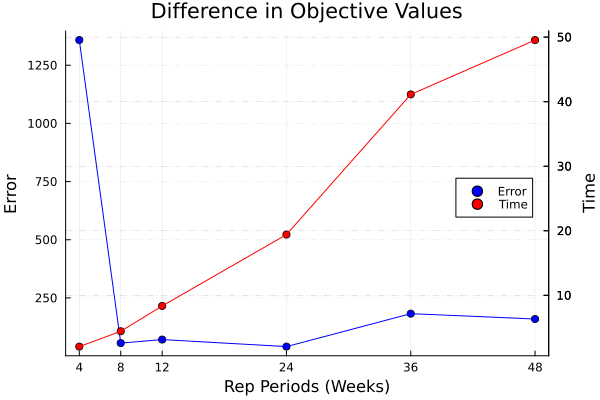

In [181]:
# Plot the differences as a function of number of representative periods
gr()
Plots.scatter(obj_val_plot[:,1],obj_val_plot[:,2],xticks=obj_val_plot[:,1],color=:blue,
                ylabel="Error",xlabel="Rep Periods (Weeks)",title="Difference in Objective Values",label=:"Error")
scatter!(obj_val_plot[:,1],NaN.*times,color=:red,legend=:right,label="Time") # For the legend
plot!(obj_val_plot[:,1],obj_val_plot[:,2],xticks=obj_val_plot[:,1],label=false,color=:blue)
scatter!(twinx(),obj_val_plot[:,1],times,color=:red,legend=false,
    yaxis=(label="Time"),label="Time")
plot!(twinx(),obj_val_plot[:,1],times,color=:red,label=false)
ygrid!(:on, :dashdot, 0.1)

Here, we can see that while having very few representative periods produces an objective value that differs greatly from the orignal, once we reach around 12 representative periods the difference begins to taper out. Therefore, the original choice of 11 maximum periods in `1_three_zones` decreases the run time of GenX significantly while while maintaining an objective value close to the original. It's important to note, however, that  the difference does not always taper out, and for some systems you'll find that the error in objective value continues to decrease as the number of representative periods increases. There also is no way to know apriori what number of periods works.


Finally, let's set TDR to have 8 and 11 min/max periods again, and delete the TDR results folder for future runs.

In [146]:
time_domain_reduction_settings["MinPeriods"] = 8;
time_domain_reduction_settings["MaxPeriods"] = 11;

In [147]:
time_domain_reduction_settings

Dict{Any, Any} with 15 entries:
  "IterativelyAddPeriods" => 1
  "ExtremePeriods"        => 1
  "UseExtremePeriods"     => 1
  "MinPeriods"            => 8
  "MaxPeriods"            => 11
  "DemandWeight"          => 1
  "ClusterFuelPrices"     => 1
  "nReps"                 => 100
  "MultiStageConcatenate" => 0
  "Threshold"             => 0.05
  "TimestepsPerRepPeriod" => 168
  "IterateMethod"         => "cluster"
  "ScalingMethod"         => "S"
  "ClusterMethod"         => "kmeans"
  "WeightTotal"           => 8760

In [152]:
rm(joinpath(case,"TDR_results"), recursive=true) 
YAML.write_file(joinpath(case,"settings/time_domain_reduction_settings.yml"), time_domain_reduction_settings)
for folder in folders
    if length(folder) >= 7 && folder[1:7] == "results"
        rm("example_systems/1_three_zones/" * folder,recursive=true) 
    end
end

LoadError: IOError: unlink("example_systems/1_three_zones/results"): no such file or directory (ENOENT)